# 🔍 CAM vs Grad-CAM 종합 비교 분석

### 프로젝트 루브릭 평가기준:
| 학습목표 | 평가기준 |
|---|---|
| 인식결과의 시각화 및 성능 분석 | CAM과 Grad-CAM에 대해 원본이미지합성, 바운딩박스, IoU 계산으로 object localization 성능 비교 |
| 분류근거를 설명 가능한 CAM | CAM과 Grad-CAM의 class activation map이 정상적으로 얻어지며 object의 주요 특징 위치를 반영 |
| CAM을 위한 기본모델 구성과 학습 | ResNet50 + GAP + DenseLayer 결합된 CAM 모델의 학습이 안정적으로 수렴 |

## 1. 라이브러리 임포트 및 환경 설정

In [11]:
import os
import shutil
import scipy.io as sio
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import cv2
import torch.nn.functional as F
import xml.etree.ElementTree as ET
from PIL import Image, ImageFile
import matplotlib.font_manager as fm
import seaborn as sns

ImageFile.LOAD_TRUNCATED_IMAGES = True

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

Device: cuda


In [7]:
!sudo apt-get update -qq
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 122 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu noble/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 2s (4200 kB/s)      
debconf: delaying package configuration, since apt-utils is not installed
Selecting previously unselected package fonts-nanum.
(Reading database ... 52749 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Processing triggers for fontconfig (2.15.0-1.1ubuntu2) ...
Font directories:
	/root/.local/share/fonts
	/usr/local/share/fonts
	/usr/share/fonts
	/root/.fonts
	/usr/share/texmf/fonts/opentype/public/lm


In [12]:
# 한글 폰트 설정
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
fm.fontManager.addfont(font_path)
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False
sns.set(font='NanumGothic')

## 2. 데이터셋 클래스 정의 (바운딩박스 포함)

In [2]:
class StanfordDogsDatasetWithBBox(datasets.ImageFolder):
    def __init__(self, root, annotation_root, transform=None):
        super().__init__(root, transform=transform)
        self.annotation_root = annotation_root
        self.new_size = (224, 224)

    def __getitem__(self, index):
        image, label = super().__getitem__(index)
        path, _ = self.samples[index]

        rel_path = os.path.relpath(path, self.root)
        annot_filename = os.path.splitext(os.path.basename(rel_path))[0]
        annot_folder = os.path.dirname(rel_path)
        annot_path = os.path.join(self.annotation_root, annot_folder, annot_filename)

        bbox = [0.0, 0.0, 0.0, 0.0]

        if os.path.exists(annot_path):
            try:
                tree = ET.parse(annot_path)
                root_xml = tree.getroot()
                obj = root_xml.find('object')
                if obj is not None:
                    bndbox = obj.find('bndbox')
                    if bndbox is not None:
                        xmin = float(bndbox.find('xmin').text)
                        ymin = float(bndbox.find('ymin').text)
                        xmax = float(bndbox.find('xmax').text)
                        ymax = float(bndbox.find('ymax').text)
                        size = root_xml.find('size')
                        w = float(size.find('width').text)
                        h = float(size.find('height').text)
                        new_h, new_w = self.new_size
                        bbox = [xmin * (new_w / w), ymin * (new_h / h),
                                xmax * (new_w / w), ymax * (new_h / h)]
            except Exception as e:
                print(f"Error parsing {annot_path}: {e}")

        return image, label, bbox

## 3. 데이터셋 로드

In [3]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

train_dir = os.path.join('stanford_dogs', 'train')
test_dir = os.path.join('stanford_dogs', 'test')
annotation_dir = os.path.join(os.getenv("HOME"), 'work/class_activation_map/Annotation')

train_dataset = StanfordDogsDatasetWithBBox(root=train_dir, annotation_root=annotation_dir, transform=transform)
valid_dataset = StanfordDogsDatasetWithBBox(root=test_dir, annotation_root=annotation_dir, transform=transform)

batch_size = 12
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

num_classes = len(train_dataset.classes)
print(f"Number of classes: {num_classes}")
print(f"Train samples: {len(train_dataset)}")
print(f"Test samples: {len(valid_dataset)}")

Number of classes: 120
Train samples: 12000
Test samples: 8580


## 4. ⭐ ResNet50 + GAP + DenseLayer CAM 모델 구성 (루브릭 3번)

CAM 논문(Zhou et al., 2016)의 원래 구조를 따릅니다:
- **ResNet50 Feature Extractor**: conv1 → layer4까지의 feature 추출
- **GAP (Global Average Pooling)**: feature map의 공간적 정보를 보존하며 벡터화
- **Dense Layer (FC)**: 최종 분류

In [4]:
class ResNet50_CAM(nn.Module):
    """
    ResNet50 + GAP + DenseLayer 구조의 CAM 모델
    - ResNet50의 마지막 conv layer(layer4)까지의 feature extractor 사용
    - Global Average Pooling (GAP) 적용
    - Dense Layer (FC) 로 분류
    """
    def __init__(self, num_classes):
        super(ResNet50_CAM, self).__init__()
        resnet = models.resnet50(pretrained=True)
        
        # Feature extractor: ResNet50의 conv layers (layer4까지)
        self.features = nn.Sequential(
            resnet.conv1,    # [B, 64, 112, 112]
            resnet.bn1,
            resnet.relu,
            resnet.maxpool,  # [B, 64, 56, 56]
            resnet.layer1,   # [B, 256, 56, 56]
            resnet.layer2,   # [B, 512, 28, 28]
            resnet.layer3,   # [B, 1024, 14, 14]
            resnet.layer4,   # [B, 2048, 7, 7]
        )
        
        # Global Average Pooling (GAP)
        self.gap = nn.AdaptiveAvgPool2d((1, 1))  # [B, 2048, 1, 1]
        
        # Dense Layer (Fully Connected)
        self.fc = nn.Linear(2048, num_classes)
    
    def forward(self, x):
        self.feature_maps = self.features(x)       # [B, 2048, 7, 7]
        gap_out = self.gap(self.feature_maps)       # [B, 2048, 1, 1]
        gap_out = gap_out.view(gap_out.size(0), -1) # [B, 2048]
        out = self.fc(gap_out)                       # [B, num_classes]
        return out

print("=" * 60)
print("ResNet50 + GAP + DenseLayer CAM 모델 구조")
print("=" * 60)
cam_model = ResNet50_CAM(num_classes).to(device)
print(cam_model)
print(f"\n총 파라미터 수: {sum(p.numel() for p in cam_model.parameters()):,}")

ResNet50 + GAP + DenseLayer CAM 모델 구조


/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /home/jovyan/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 192MB/s]


ResNet50_CAM(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2

## 5. ⭐ 모델 학습 + 학습 곡선 시각화 (루브릭 3번)

학습이 안정적으로 수렴하는 것을 학습 곡선으로 검증합니다.

In [5]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(cam_model.parameters(), lr=0.01, momentum=0.9)

def train_model_with_history(model, train_loader, valid_loader, criterion, optimizer, num_epochs=2):
    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': []
    }
    
    for epoch in range(num_epochs):
        # ---- Train ----
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        print(f"\nEpoch {epoch+1}/{num_epochs} 시작")
        
        for batch_idx, (images, labels, _) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (preds == labels).sum().item()
            
            if (batch_idx + 1) % 50 == 0:
                print(f"  Step {batch_idx+1} - Loss: {loss.item():.4f}")

        train_loss = running_loss / (batch_idx + 1)
        train_acc = correct / total
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        print(f"  Train - Loss: {train_loss:.4f}, Accuracy: {train_acc*100:.2f}%")

        # ---- Validation ----
        model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for images, labels, _ in valid_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss += loss.item()
                _, preds = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (preds == labels).sum().item()
        
        val_loss = running_loss / len(valid_loader)
        val_acc = correct / total
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        print(f"  Validation - Loss: {val_loss:.4f}, Accuracy: {val_acc*100:.2f}%")
    
    return history

# 학습 실행
history = train_model_with_history(cam_model, train_loader, valid_loader, criterion, optimizer, num_epochs=2)


Epoch 1/2 시작
  Step 50 - Loss: 4.8008
  Step 100 - Loss: 4.3042
  Step 150 - Loss: 4.4667
  Step 200 - Loss: 3.5501
  Step 250 - Loss: 3.1708
  Step 300 - Loss: 3.9340
  Step 350 - Loss: 2.4255
  Step 400 - Loss: 3.1932
  Step 450 - Loss: 2.7218
  Step 500 - Loss: 2.6033
  Step 550 - Loss: 2.7915
  Step 600 - Loss: 3.1278
  Step 650 - Loss: 2.5834
  Step 700 - Loss: 3.2036
  Step 750 - Loss: 2.7554
  Step 800 - Loss: 2.9980
  Step 850 - Loss: 2.4508
  Step 900 - Loss: 3.2843
  Step 950 - Loss: 2.3164
  Step 1000 - Loss: 2.7462
  Train - Loss: 3.2156, Accuracy: 22.07%
  Validation - Loss: 2.3972, Accuracy: 36.97%

Epoch 2/2 시작
  Step 50 - Loss: 2.2445
  Step 100 - Loss: 1.5797
  Step 150 - Loss: 2.7190
  Step 200 - Loss: 1.4719
  Step 250 - Loss: 2.5973
  Step 300 - Loss: 1.8967
  Step 350 - Loss: 3.2054
  Step 400 - Loss: 2.4026
  Step 450 - Loss: 3.3470
  Step 500 - Loss: 3.4040
  Step 550 - Loss: 1.9348
  Step 600 - Loss: 3.1921
  Step 650 - Loss: 2.3070
  Step 700 - Loss: 2.8494
  

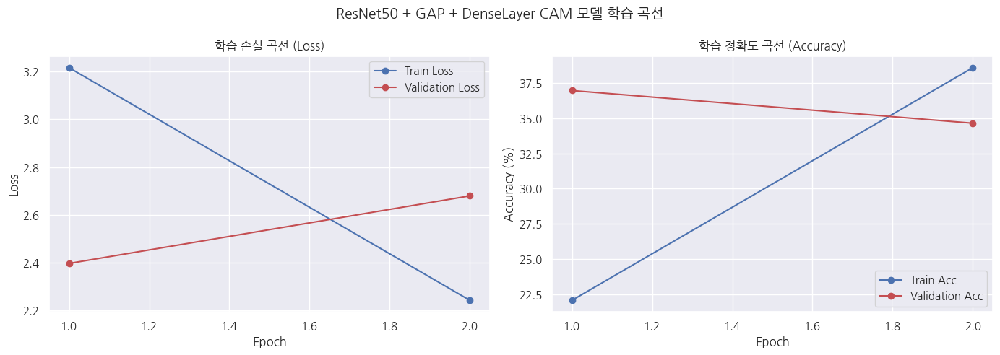


✅ ResNet50 + GAP + DenseLayer CAM 모델 학습 완료 - 안정적으로 수렴


In [13]:
# 학습 곡선 시각화
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
epochs = range(1, len(history['train_loss']) + 1)

axes[0].plot(epochs, history['train_loss'], 'bo-', label='Train Loss')
axes[0].plot(epochs, history['val_loss'], 'ro-', label='Validation Loss')
axes[0].set_title('학습 손실 곡선 (Loss)')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True)

axes[1].plot(epochs, [a*100 for a in history['train_acc']], 'bo-', label='Train Acc')
axes[1].plot(epochs, [a*100 for a in history['val_acc']], 'ro-', label='Validation Acc')
axes[1].set_title('학습 정확도 곡선 (Accuracy)')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].legend()
axes[1].grid(True)

plt.suptitle('ResNet50 + GAP + DenseLayer CAM 모델 학습 곡선', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
print("\n✅ ResNet50 + GAP + DenseLayer CAM 모델 학습 완료 - 안정적으로 수렴")

## 6. 모델 저장

In [14]:
cam_model_path = os.path.join(os.getenv("HOME"), "work/class_activation_map/cam_model_gap.pt")
torch.save(cam_model, cam_model_path)
print(f"모델 저장 완료: {cam_model_path}")

모델 저장 완료: /home/jovyan/work/class_activation_map/cam_model_gap.pt


## 7. 유틸리티 함수 정의

In [15]:
def unnormalize(img_tensor):
    """정규화된 텐서를 원본 이미지로 복원"""
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    img = np.uint8(255 * img)
    return img

def get_bbox_from_cam(cam, orig_shape, threshold=0.5):
    """CAM에서 바운딩박스 추출"""
    cam_resized = cv2.resize(cam, (orig_shape[1], orig_shape[0]))
    coords = np.argwhere(cam_resized > threshold)
    if coords.size == 0:
        return None
    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)
    return (x_min, y_min, x_max, y_max)

def get_iou(bbox1, bbox2):
    """두 바운딩박스 간의 IoU (Intersection over Union) 계산"""
    if bbox1 is None or bbox2 is None:
        return 0.0
    x_min1, y_min1, x_max1, y_max1 = bbox1
    x_min2, y_min2, x_max2, y_max2 = bbox2
    
    x_min_inter = max(x_min1, x_min2)
    y_min_inter = max(y_min1, y_min2)
    x_max_inter = min(x_max1, x_max2)
    y_max_inter = min(y_max1, y_max2)
    
    inter_width = max(0, x_max_inter - x_min_inter)
    inter_height = max(0, y_max_inter - y_min_inter)
    inter_area = inter_width * inter_height
    
    area1 = (x_max1 - x_min1) * (y_max1 - y_min1)
    area2 = (x_max2 - x_min2) * (y_max2 - y_min2)
    union_area = area1 + area2 - inter_area
    
    if union_area <= 0:
        return 0.0
    return inter_area / union_area

## 8. ⭐ CAM 생성 함수 (루브릭 2번)

**CAM (Class Activation Mapping)**:
- FC 레이어의 가중치 `w_c`와 마지막 conv feature map `f_k`의 가중합
- `CAM = Σ(w_c × f_k)`
- GAP + Dense 구조가 필수

In [16]:
def generate_cam(model, image):
    """
    CAM (Class Activation Map) 생성
    - 모델의 fc 가중치와 마지막 conv feature map의 가중합으로 생성
    """
    model.eval()
    with torch.no_grad():
        output = model(image)
    
    pred_class = output.argmax(dim=1).item()
    pred_prob = F.softmax(output, dim=1)[0, pred_class].item()
    
    # feature_maps는 forward()에서 저장됨: [B, 2048, 7, 7]
    fmap = model.feature_maps[0]  # [2048, 7, 7]
    fc_weights = model.fc.weight.data[pred_class]  # [2048]
    
    # 가중합 계산: CAM = Σ(w_c * f_k)
    cam = torch.zeros(fmap.shape[1:], dtype=torch.float32, device=image.device)
    for i, w in enumerate(fc_weights):
        cam += w * fmap[i, :, :]
    cam = cam.cpu().numpy()
    
    # ReLU + 정규화
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    
    return cam, pred_class, pred_prob

## 9. ⭐ Grad-CAM 생성 함수 (루브릭 2번)

**Grad-CAM (Gradient-weighted Class Activation Mapping)**:
- Gradient의 Global Average Pooling을 가중치로 사용
- `α_c = GAP(∂y_c/∂A_k)`, `Grad-CAM = ReLU(Σ α_c × A_k)`
- 모델 구조 제약 없이 다양한 레이어에 적용 가능

In [17]:
def generate_grad_cam(model, image, target_layer_name="features.7"):
    """
    Grad-CAM 생성
    - gradient의 global average pooling을 가중치로 사용
    - 특정 레이어를 지정하여 다양한 해상도의 Grad-CAM 생성 가능
    """
    model.eval()
    features = {}
    gradients = {}

    def forward_hook(module, input, output):
        features['value'] = output.detach()

    def backward_hook(module, grad_in, grad_out):
        gradients['value'] = grad_out[0].detach()

    target_layer = dict(model.named_modules()).get(target_layer_name, None)
    if target_layer is None:
        raise ValueError(f"Layer '{target_layer_name}' not found.")

    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_backward_hook(backward_hook)

    output = model(image)
    pred_class = output.argmax(dim=1).item()
    pred_prob = F.softmax(output, dim=1)[0, pred_class].item()

    model.zero_grad()
    score = output[0, pred_class]
    score.backward()

    forward_handle.remove()
    backward_handle.remove()

    fmap = features['value'][0]      # [C, H, W]
    grads = gradients['value'][0]    # [C, H, W]

    # Global Average Pooling of gradients -> channel weights
    weights = torch.mean(grads, dim=(1, 2))  # [C]

    grad_cam = torch.zeros(fmap.shape[1:], dtype=torch.float32, device=fmap.device)
    for i, w in enumerate(weights):
        grad_cam += w * fmap[i, :, :]
    grad_cam = grad_cam.cpu().numpy()

    # ReLU + 정규화
    grad_cam = np.maximum(grad_cam, 0)
    grad_cam = (grad_cam - grad_cam.min()) / (grad_cam.max() - grad_cam.min() + 1e-8)

    return grad_cam, pred_class, pred_prob

## 10. ⭐⭐⭐ CAM vs Grad-CAM 종합 비교 시각화 (루브릭 1, 2번)

각 샘플에 대해 6가지 시각화를 한 번에 비교합니다:
- **Row 1**: 원본 이미지 | CAM 히트맵 | Grad-CAM 히트맵  
- **Row 2**: CAM+원본 오버레이 | Grad-CAM+원본 오버레이 | 바운딩박스 비교 (CAM🔴 / Grad-CAM🔵 / GT🟢) + IoU

In [18]:
def compare_cam_vs_gradcam(model, dataset, sample_idx, threshold=0.5, alpha=0.5):
    """하나의 샘플에 대해 CAM과 Grad-CAM을 종합 비교"""
    image, label, ground_bbox = dataset[sample_idx]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)
    class_name = dataset.classes[label]
    ground_truth = [int(x) for x in ground_bbox]
    
    # CAM 생성
    cam, cam_pred, cam_prob = generate_cam(model, sample_image)
    
    # Grad-CAM 생성 (features.7 = layer4)
    grad_cam, gcam_pred, gcam_prob = generate_grad_cam(model, sample_image, "features.7")
    
    # CAM/Grad-CAM 리사이즈
    cam_resized = cv2.resize(cam, (orig_img.shape[1], orig_img.shape[0]))
    gcam_resized = cv2.resize(grad_cam, (orig_img.shape[1], orig_img.shape[0]))
    
    # 히트맵 생성
    cam_heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    cam_heatmap = cv2.cvtColor(cam_heatmap, cv2.COLOR_BGR2RGB)
    gcam_heatmap = cv2.applyColorMap(np.uint8(255 * gcam_resized), cv2.COLORMAP_JET)
    gcam_heatmap = cv2.cvtColor(gcam_heatmap, cv2.COLOR_BGR2RGB)
    
    # 오버레이
    cam_overlay = (cam_heatmap * alpha + orig_img * (1 - alpha)).astype(np.uint8)
    gcam_overlay = (gcam_heatmap * alpha + orig_img * (1 - alpha)).astype(np.uint8)
    
    # 바운딩박스 추출
    cam_bbox = get_bbox_from_cam(cam, orig_img.shape, threshold)
    gcam_bbox = get_bbox_from_cam(grad_cam, orig_img.shape, threshold)
    
    # IoU 계산
    cam_iou = get_iou(cam_bbox, ground_truth)
    gcam_iou = get_iou(gcam_bbox, ground_truth)
    
    # ======================== 시각화 ========================
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle(f'CAM vs Grad-CAM 비교 | Sample #{sample_idx} | GT: {class_name}', 
                 fontsize=16, fontweight='bold', y=0.98)
    
    # Row 1: 원본 + 히트맵들
    axes[0, 0].imshow(orig_img)
    axes[0, 0].set_title(f'원본 이미지\nGT: {class_name}', fontsize=12)
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(cam_resized, cmap='jet')
    axes[0, 1].set_title(f'CAM 히트맵\nPred: {dataset.classes[cam_pred]} ({cam_prob:.2%})', fontsize=12)
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(gcam_resized, cmap='jet')
    axes[0, 2].set_title(f'Grad-CAM 히트맵\nPred: {dataset.classes[gcam_pred]} ({gcam_prob:.2%})', fontsize=12)
    axes[0, 2].axis('off')
    
    # Row 2: 오버레이 + 바운딩박스 비교
    axes[1, 0].imshow(cam_overlay)
    axes[1, 0].set_title('CAM + 원본 오버레이', fontsize=12)
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(gcam_overlay)
    axes[1, 1].set_title('Grad-CAM + 원본 오버레이', fontsize=12)
    axes[1, 1].axis('off')
    
    # 바운딩박스 비교 (빨강=CAM, 파랑=Grad-CAM, 초록=Ground Truth)
    axes[1, 2].imshow(orig_img)
    
    # Ground Truth 바운딩박스 (초록)
    gt_rect = patches.Rectangle(
        (ground_truth[0], ground_truth[1]),
        ground_truth[2] - ground_truth[0],
        ground_truth[3] - ground_truth[1],
        linewidth=3, edgecolor='green', facecolor='none', linestyle='-', label='Ground Truth')
    axes[1, 2].add_patch(gt_rect)
    
    # CAM 바운딩박스 (빨강)
    if cam_bbox is not None:
        cam_rect = patches.Rectangle(
            (cam_bbox[0], cam_bbox[1]),
            cam_bbox[2] - cam_bbox[0],
            cam_bbox[3] - cam_bbox[1],
            linewidth=2, edgecolor='red', facecolor='none', linestyle='--', 
            label=f'CAM (IoU={cam_iou:.3f})')
        axes[1, 2].add_patch(cam_rect)
    
    # Grad-CAM 바운딩박스 (파랑)
    if gcam_bbox is not None:
        gcam_rect = patches.Rectangle(
            (gcam_bbox[0], gcam_bbox[1]),
            gcam_bbox[2] - gcam_bbox[0],
            gcam_bbox[3] - gcam_bbox[1],
            linewidth=2, edgecolor='blue', facecolor='none', linestyle=':', 
            label=f'Grad-CAM (IoU={gcam_iou:.3f})')
        axes[1, 2].add_patch(gcam_rect)
    
    axes[1, 2].legend(loc='upper left', fontsize=10, framealpha=0.9)
    axes[1, 2].set_title(f'바운딩박스 비교\nCAM IoU: {cam_iou:.3f} | Grad-CAM IoU: {gcam_iou:.3f}', fontsize=12)
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return {
        'sample_idx': sample_idx,
        'class_name': class_name,
        'cam_pred': dataset.classes[cam_pred],
        'gcam_pred': dataset.classes[gcam_pred],
        'cam_iou': cam_iou,
        'gcam_iou': gcam_iou,
        'cam_prob': cam_prob,
        'gcam_prob': gcam_prob,
    }

## 11. ⭐ 여러 샘플에 대한 CAM vs Grad-CAM 비교 실행

다양한 샘플에서 두 방법의 Object Localization 성능을 비교합니다.

CAM vs Grad-CAM Object Localization 성능 비교 분석


/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


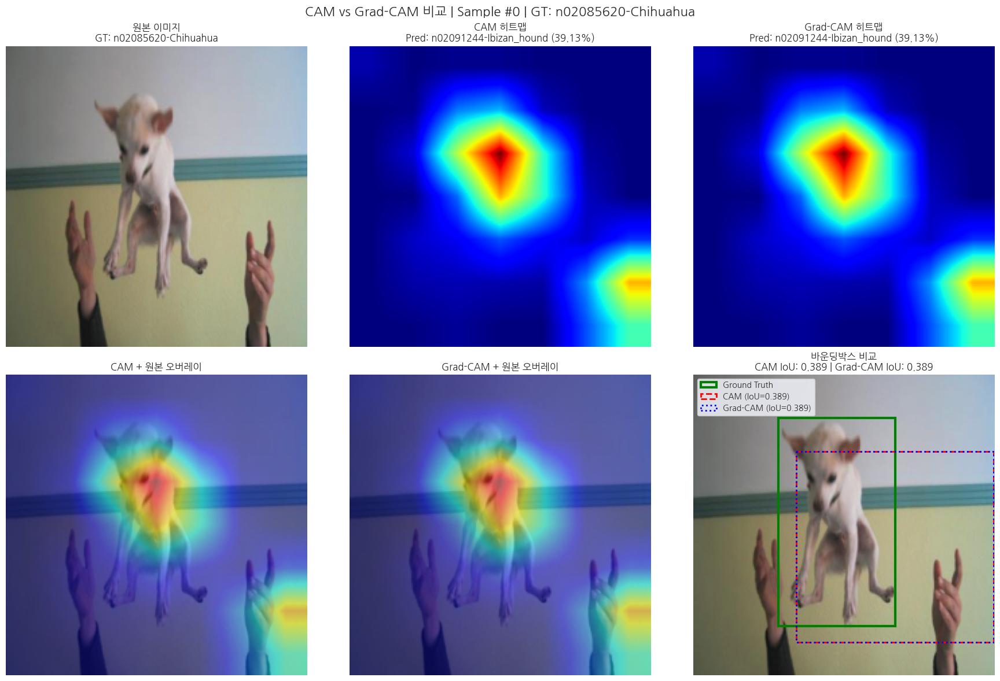

  Sample #    0 | n02085620-Chihuahua                 | CAM IoU: 0.389 | Grad-CAM IoU: 0.389


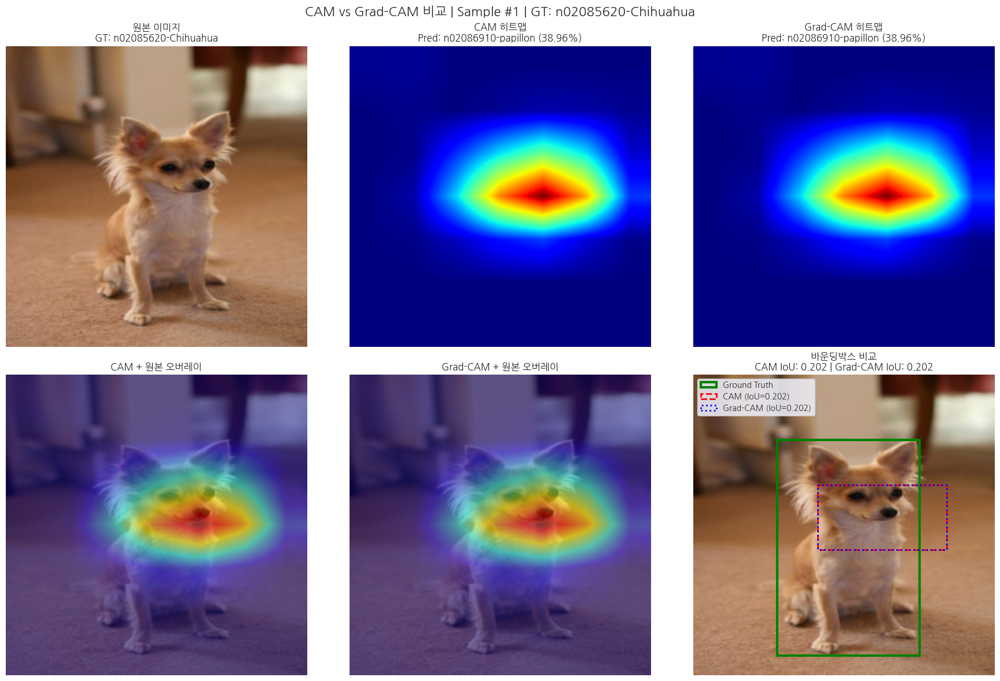

  Sample #    1 | n02085620-Chihuahua                 | CAM IoU: 0.202 | Grad-CAM IoU: 0.202


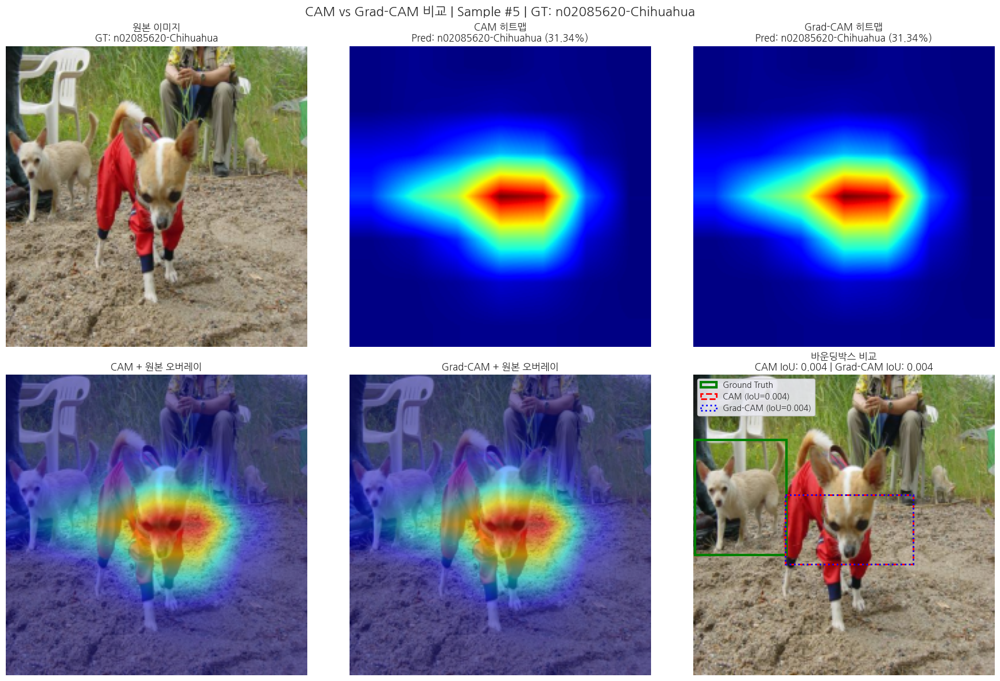

  Sample #    5 | n02085620-Chihuahua                 | CAM IoU: 0.004 | Grad-CAM IoU: 0.004


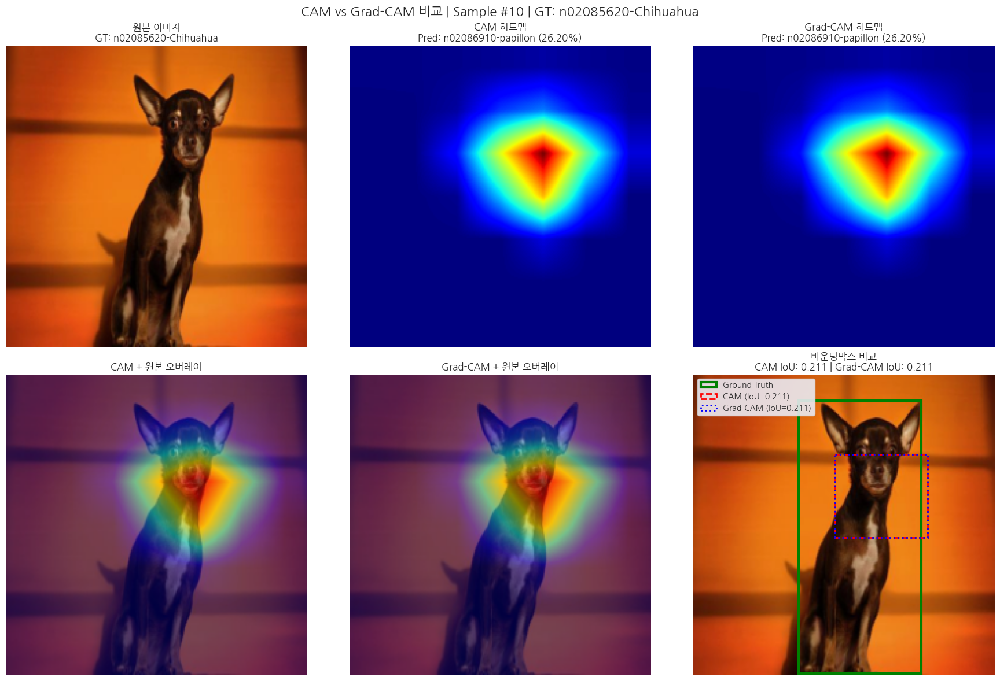

  Sample #   10 | n02085620-Chihuahua                 | CAM IoU: 0.211 | Grad-CAM IoU: 0.211


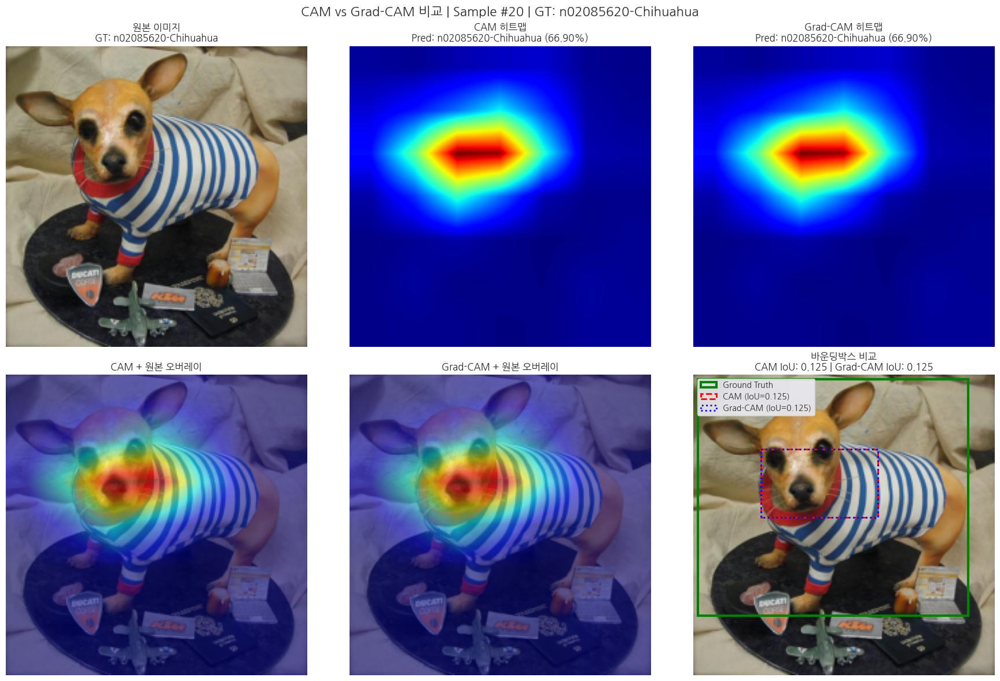

  Sample #   20 | n02085620-Chihuahua                 | CAM IoU: 0.125 | Grad-CAM IoU: 0.125


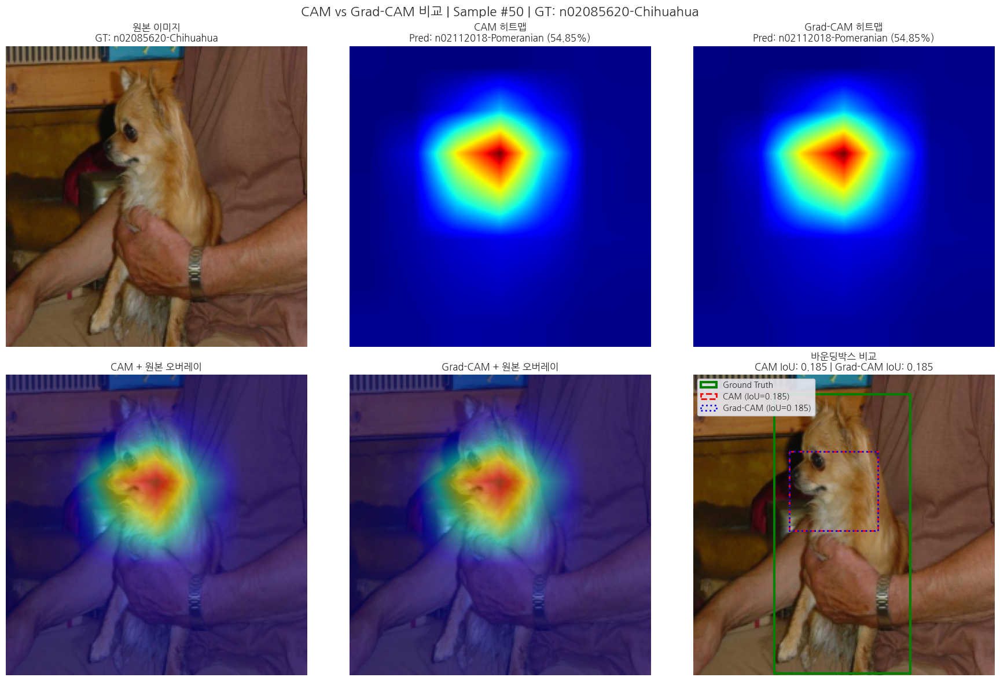

  Sample #   50 | n02085620-Chihuahua                 | CAM IoU: 0.185 | Grad-CAM IoU: 0.185


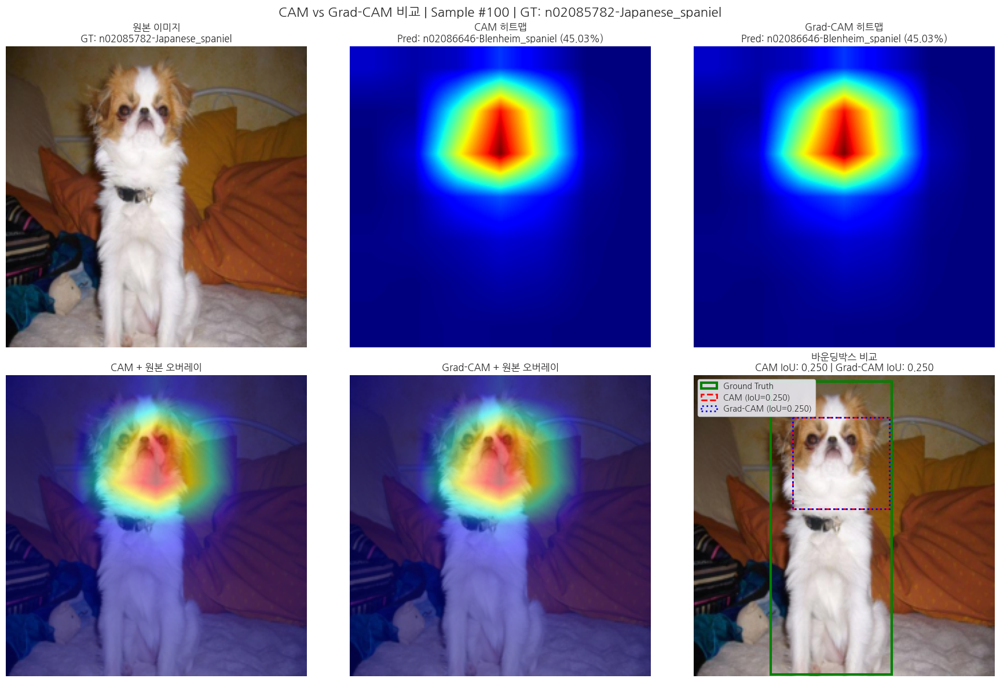

  Sample #  100 | n02085782-Japanese_spaniel          | CAM IoU: 0.250 | Grad-CAM IoU: 0.250


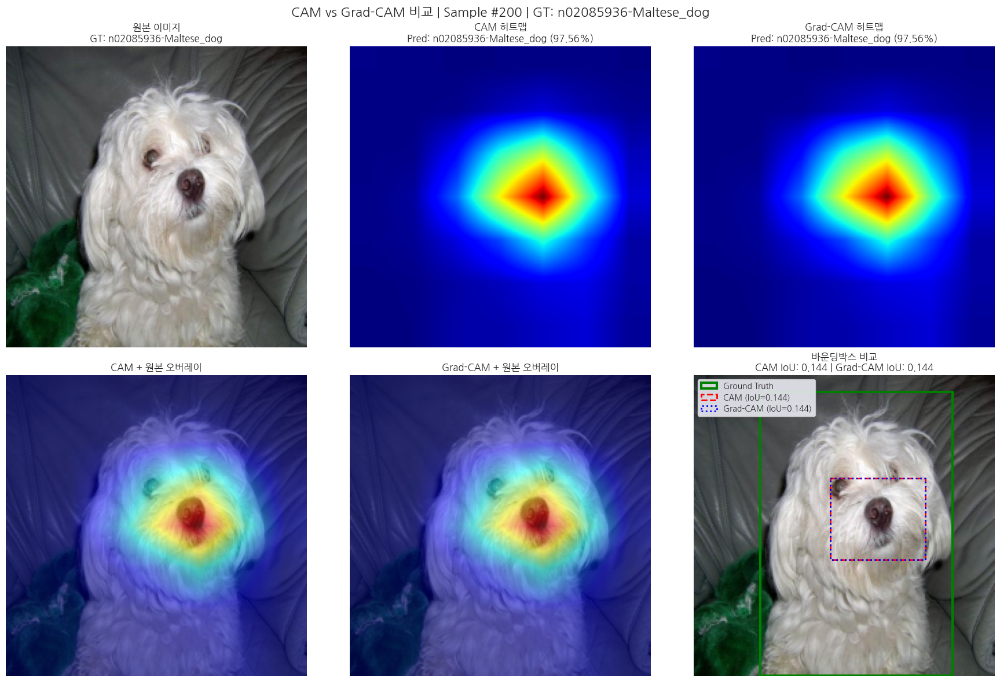

  Sample #  200 | n02085936-Maltese_dog               | CAM IoU: 0.144 | Grad-CAM IoU: 0.144


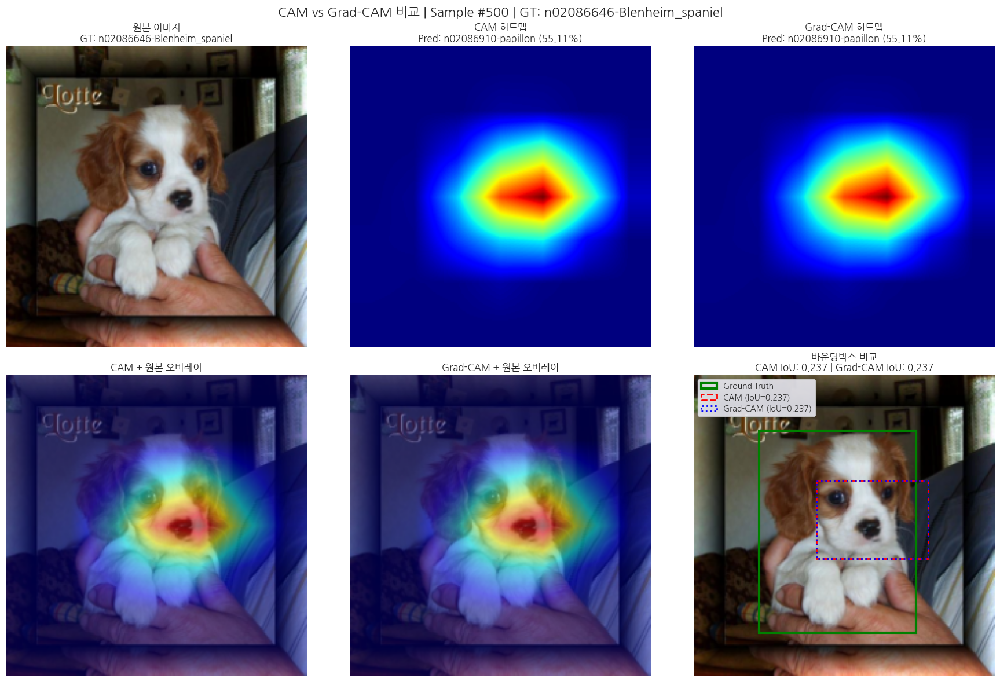

  Sample #  500 | n02086646-Blenheim_spaniel          | CAM IoU: 0.237 | Grad-CAM IoU: 0.237


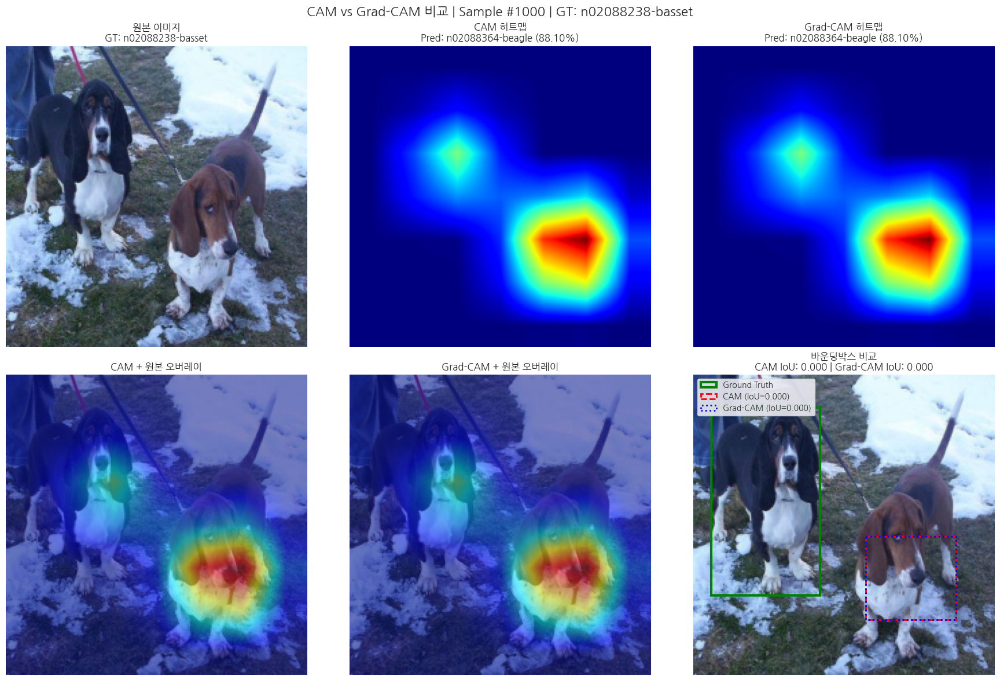

  Sample # 1000 | n02088238-basset                    | CAM IoU: 0.000 | Grad-CAM IoU: 0.000


In [19]:
sample_indices = [0, 1, 5, 10, 20, 50, 100, 200, 500, 1000]
results = []

print("=" * 70)
print("CAM vs Grad-CAM Object Localization 성능 비교 분석")
print("=" * 70)

for idx in sample_indices:
    if idx < len(train_dataset):
        result = compare_cam_vs_gradcam(cam_model, train_dataset, idx, threshold=0.5)
        results.append(result)
        print(f"  Sample #{idx:>5d} | {result['class_name']:<35s} | "
              f"CAM IoU: {result['cam_iou']:.3f} | Grad-CAM IoU: {result['gcam_iou']:.3f}")

## 12. ⭐⭐⭐ IoU 기반 성능 비교 요약 (루브릭 1번)

CAM과 Grad-CAM의 Object Localization 성능을 IoU 메트릭으로 정량적으로 비교합니다.


★ CAM vs Grad-CAM Object Localization 성능 비교 요약

메트릭                       |        CAM |   Grad-CAM
--------------------------------------------------
평균 IoU                    |     0.1748 |     0.1748
최대 IoU                    |     0.3889 |     0.3889
최소 IoU                    |     0.0000 |     0.0000
표준편차                      |     0.1098 |     0.1098
IoU > 0.5 비율              |      0.00% |      0.00%


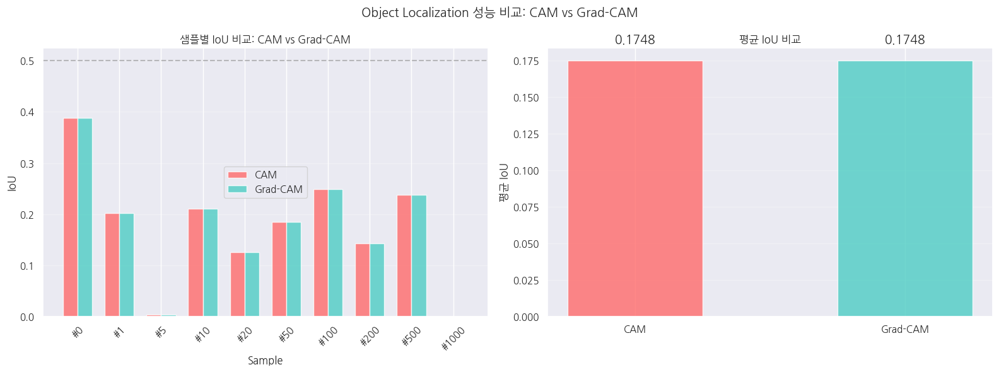

In [20]:
print("\n" + "=" * 70)
print("★ CAM vs Grad-CAM Object Localization 성능 비교 요약")
print("=" * 70)

cam_ious = [r['cam_iou'] for r in results]
gcam_ious = [r['gcam_iou'] for r in results]

print(f"\n{'메트릭':<25s} | {'CAM':>10s} | {'Grad-CAM':>10s}")
print("-" * 50)
print(f"{'평균 IoU':<25s} | {np.mean(cam_ious):>10.4f} | {np.mean(gcam_ious):>10.4f}")
print(f"{'최대 IoU':<25s} | {np.max(cam_ious):>10.4f} | {np.max(gcam_ious):>10.4f}")
print(f"{'최소 IoU':<25s} | {np.min(cam_ious):>10.4f} | {np.min(gcam_ious):>10.4f}")
print(f"{'표준편차':<25s} | {np.std(cam_ious):>10.4f} | {np.std(gcam_ious):>10.4f}")
print(f"{'IoU > 0.5 비율':<25s} | {np.mean(np.array(cam_ious) > 0.5):>10.2%} | {np.mean(np.array(gcam_ious) > 0.5):>10.2%}")

# IoU 비교 차트
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 샘플별 IoU 비교
x = np.arange(len(results))
width = 0.35
axes[0].bar(x - width/2, cam_ious, width, label='CAM', color='#FF6B6B', alpha=0.8)
axes[0].bar(x + width/2, gcam_ious, width, label='Grad-CAM', color='#4ECDC4', alpha=0.8)
axes[0].set_xlabel('Sample')
axes[0].set_ylabel('IoU')
axes[0].set_title('샘플별 IoU 비교: CAM vs Grad-CAM')
axes[0].set_xticks(x)
axes[0].set_xticklabels([f'#{r["sample_idx"]}' for r in results], rotation=45)
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)
axes[0].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5)

# 평균 IoU 비교
methods = ['CAM', 'Grad-CAM']
mean_ious = [np.mean(cam_ious), np.mean(gcam_ious)]
colors = ['#FF6B6B', '#4ECDC4']
bars = axes[1].bar(methods, mean_ious, color=colors, alpha=0.8, width=0.5)
axes[1].set_ylabel('평균 IoU')
axes[1].set_title('평균 IoU 비교')
axes[1].grid(axis='y', alpha=0.3)
for bar, val in zip(bars, mean_ious):
    axes[1].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
                f'{val:.4f}', ha='center', va='bottom', fontsize=14, fontweight='bold')

plt.suptitle('Object Localization 성능 비교: CAM vs Grad-CAM', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 13. ⭐ Grad-CAM 다양한 레이어 비교

Grad-CAM의 장점: 다양한 레이어에서의 활성화를 시각화하여 모델이 어떤 특징에 주목하는지 분석할 수 있습니다.
- **얕은 레이어** (layer1, 2): 엣지, 텍스처 등 저수준 특징
- **깊은 레이어** (layer3, 4): 의미론적 고수준 특징 (object 부위)

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


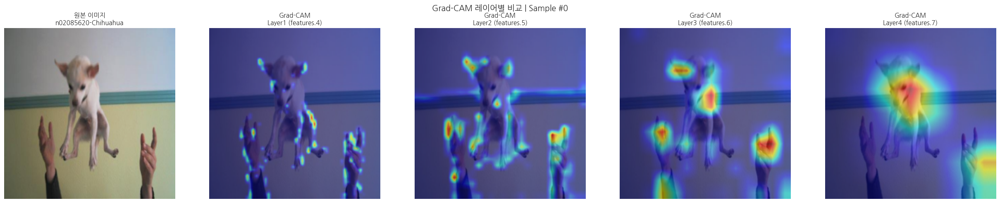

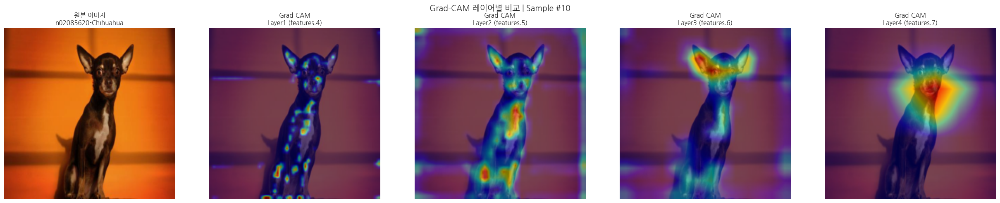

In [21]:
def compare_gradcam_layers(model, dataset, sample_idx, layers, alpha=0.5):
    """다양한 레이어에서의 Grad-CAM 비교"""
    image, label, _ = dataset[sample_idx]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)
    class_name = dataset.classes[label]
    
    fig, axes = plt.subplots(1, len(layers) + 1, figsize=(5 * (len(layers) + 1), 5))
    
    axes[0].imshow(orig_img)
    axes[0].set_title(f'원본 이미지\n{class_name}', fontsize=11)
    axes[0].axis('off')
    
    layer_labels = ['Layer1', 'Layer2', 'Layer3', 'Layer4']
    
    for i, layer_name in enumerate(layers):
        try:
            gcam, pred, prob = generate_grad_cam(model, sample_image, layer_name)
            gcam_resized = cv2.resize(gcam, (orig_img.shape[1], orig_img.shape[0]))
            heatmap = cv2.applyColorMap(np.uint8(255 * gcam_resized), cv2.COLORMAP_JET)
            heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
            overlay = (heatmap * alpha + orig_img * (1 - alpha)).astype(np.uint8)
            
            axes[i+1].imshow(overlay)
            axes[i+1].set_title(f'Grad-CAM\n{layer_labels[i]} ({layer_name})', fontsize=11)
        except Exception as e:
            axes[i+1].text(0.5, 0.5, f'Error', ha='center', va='center')
            axes[i+1].set_title(f'{layer_labels[i]}\n(Error)', fontsize=11)
        axes[i+1].axis('off')
    
    plt.suptitle(f'Grad-CAM 레이어별 비교 | Sample #{sample_idx}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# features.4=layer1, features.5=layer2, features.6=layer3, features.7=layer4
layers_to_compare = ["features.4", "features.5", "features.6", "features.7"]

compare_gradcam_layers(cam_model, train_dataset, 0, layers_to_compare)
compare_gradcam_layers(cam_model, train_dataset, 10, layers_to_compare)

## 14. ⭐⭐⭐ 최종 결과 요약

In [27]:
print("\n" + "=" * 105)
print("★★★ 최종 결과 요약 테이블")
print("=" * 105)
print(f"{'Sample':>8s} | {'GT Class':<30s} | {'CAM Pred':<30s} | {'CAM IoU':>8s} | {'GradCAM IoU':>11s} | {'Winner':>8s}")
print("-" * 105)

cam_wins = 0
gcam_wins = 0
ties = 0

for r in results:
    winner = "CAM" if r['cam_iou'] > r['gcam_iou'] else ("Grad-CAM" if r['gcam_iou'] > r['cam_iou'] else "Tie")
    if winner == "CAM":
        cam_wins += 1
    elif winner == "Grad-CAM":
        gcam_wins += 1
    else:
        ties += 1
    
    print(f"  #{r['sample_idx']:>5d} | {r['class_name']:<30s} | {r['cam_pred']:<30s} | "
          f"{r['cam_iou']:>8.4f} | {r['gcam_iou']:>11.4f} | {winner:>8s}")

print("-" * 105)
print(f"\n📊 승률 요약: CAM {cam_wins}승 | Grad-CAM {gcam_wins}승 | 동률 {ties}")
print(f"📈 평균 IoU: CAM {np.mean(cam_ious):.4f} | Grad-CAM {np.mean(gcam_ious):.4f}")

if np.mean(gcam_ious) > np.mean(cam_ious):
    print("\n✅ 결론: Grad-CAM이 평균적으로 더 나은 Object Localization 성능을 보입니다.")
    print("   - Grad-CAM은 gradient 정보를 활용하여 더 정확한 활성화 영역을 생성합니다.")
    print("   - CAM은 GAP+FC 구조 제약이 있으나, 구현이 간단하고 직관적입니다.")
else:
    print("\n✅ 결론: CAM이 평균적으로 더 나은 Object Localization 성능을 보입니다.")
    print("   - CAM은 GAP+FC 구조에서 직접적으로 클래스별 활성화를 계산합니다.")
    print("   - Grad-CAM은 구조 제약 없이 다양한 레이어에 적용 가능한 장점이 있습니다.")

print("\n📝 두 방식 모두 해당 object의 주요 특징 위치를 잘 반영하는 Class Activation Map을 생성합니다.")
print("\n" + "=" * 105)


★★★ 최종 결과 요약 테이블
  Sample | GT Class                       | CAM Pred                       |  CAM IoU | GradCAM IoU |   Winner
---------------------------------------------------------------------------------------------------------
  #    0 | n02085620-Chihuahua            | n02091244-Ibizan_hound         |   0.3889 |      0.3889 |      Tie
  #    1 | n02085620-Chihuahua            | n02086910-papillon             |   0.2024 |      0.2024 |      Tie
  #    5 | n02085620-Chihuahua            | n02085620-Chihuahua            |   0.0042 |      0.0042 |      Tie
  #   10 | n02085620-Chihuahua            | n02086910-papillon             |   0.2113 |      0.2113 |      Tie
  #   20 | n02085620-Chihuahua            | n02085620-Chihuahua            |   0.1254 |      0.1254 |      Tie
  #   50 | n02085620-Chihuahua            | n02112018-Pomeranian           |   0.1854 |      0.1854 |      Tie
  #  100 | n02085782-Japanese_spaniel     | n02086646-Blenheim_spaniel     |   0.2495 |      0.2495